In [2]:
import numpy
import torch
from tqdm.notebook import tqdm
from diffusers import FluxKontextInpaintPipeline
from nunchaku import NunchakuFluxTransformer2DModelV2
from transformers import T5EncoderModel, T5Config
from nunchaku.utils import get_precision, get_gpu_memory
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import os
import random
from ultralytics.utils.ops import xywhn2xyxy, xyxy2xywh
from ultralytics.utils.plotting import Annotator, colors

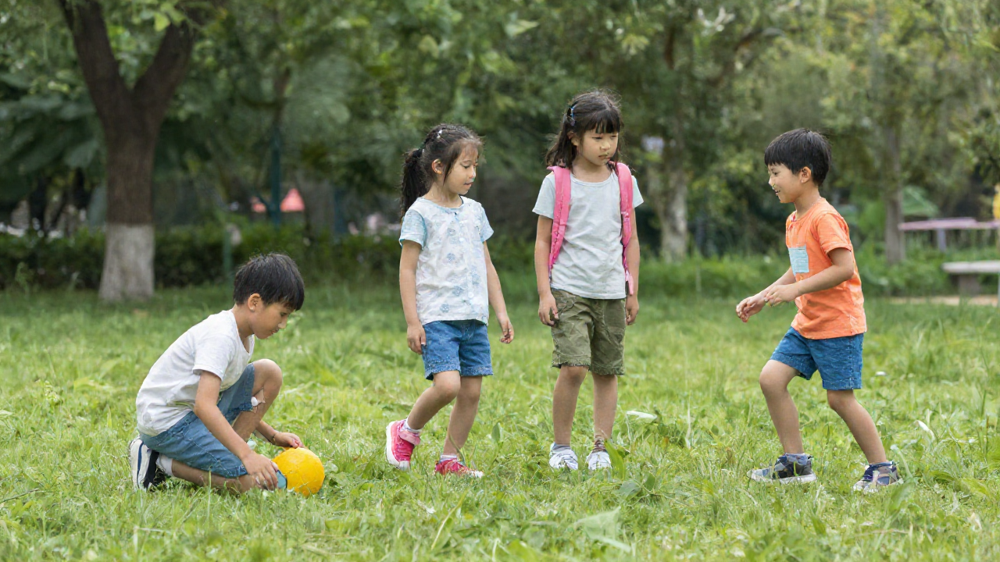

In [19]:
image_id = random.randint(0, 194)
image = Image.open(f'dataset/backgrounds/{image_id}.png').convert("RGB")
image

In [37]:
prompts = [
    "Add a large black suitcase on the ground",
    "Add a red backpack on the ground",
    "Add a big box on the ground",
    "Add a large sack on the ground",
]

In [21]:
def load_flux_kontext_pipeline():
    transformer = NunchakuFluxTransformer2DModelV2.from_pretrained(
        f"nunchaku-tech/nunchaku-flux.1-kontext-dev/svdq-{get_precision()}_r32-flux.1-kontext-dev.safetensors")


    pipe = FluxKontextInpaintPipeline.from_pretrained("black-forest-labs/FLUX.1-Kontext-dev", transformer=transformer,
                                                      torch_dtype=torch.bfloat16).to('cuda')

    if get_gpu_memory() > 18:
        pipe.enable_model_cpu_offload()
    else:
        pipe._exclude_from_cpu_offload.append("transformer")
        pipe.enable_sequential_cpu_offload()

    return pipe


def flux_kontext_inpaint(pipe: FluxKontextInpaintPipeline, img: Image.Image, bbox: numpy.ndarray,
                         prompt: str) -> Image.Image:
    img_np = np.array(img)
    h, w = img_np.shape[:2]

    mask = np.zeros((h, w), dtype=np.uint8)
    x1, y1, x2, y2 = bbox.astype(int)
    mask[y1:y2, x1:x2] = 255  # White rectangle for inpainting area

    mask_pil = Image.fromarray(mask)

    seed = random.randint(0, 2 ** 31 - 1)
    generator = torch.Generator(device='cuda').manual_seed(seed)

    inpainted_img = pipe(
        prompt=prompt,
        image=img,
        mask_image=mask_pil,
        guidance_scale=2.5,
        generator=generator,
        strength=1.0).images[0]

    return inpainted_img

In [22]:
def read_yolo_labels(txt_path: str | Path) -> np.ndarray:
    """
    Returns Nx5 float array: [cls, xc, yc, w, h] (normalized).
    Empty file -> shape (0, 5).
    """
    txt_path = Path(txt_path)
    if not txt_path.exists() or txt_path.stat().st_size == 0:
        return np.zeros((0, 5), dtype=np.float32)

    rows = []
    for line in txt_path.read_text(encoding="utf-8").splitlines():
        line = line.strip()
        if not line:
            continue
        parts = line.split()
        if len(parts) != 5:
            raise ValueError(f"Bad label line in {txt_path}: {line}")
        rows.append([float(p) for p in parts])
    return np.asarray(rows, dtype=np.float32)[:, 1:]


def top_k_by_area_xywh(xywh: np.ndarray, k: int = 3) -> np.ndarray:
    """
    xywh: Nx4 array [x, y, w, h] (absolute or normalized; area ranking is the same).
    Returns up to k rows, largest areas first.
    """
    xywh = np.asarray(xywh)
    if xywh.size == 0:
        return xywh.reshape(0, 4)

    areas = xywh[:, 2] * xywh[:, 3]
    k = min(k, len(xywh))
    idx = np.argsort(areas)[::-1][:k]
    return xywh[idx]

In [23]:
labels = read_yolo_labels(f"dataset/people-box/labels/{image_id}.txt")
labels[:, 2] *= 1.05
labels[:, 3] *= 1.05
top3 = top_k_by_area_xywh(labels, k=3)
xyxy = xywhn2xyxy(top3, w=1280, h=720)



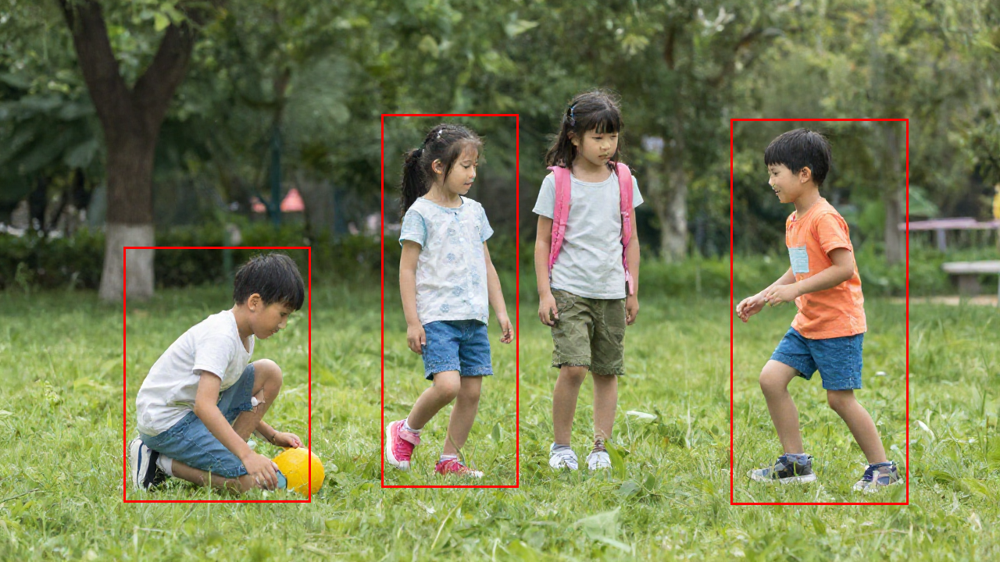

In [24]:
ann = Annotator(image.copy())
for box in xyxy:
    ann.box_label(box, color=(255, 0, 0))
Image.fromarray(ann.result())

In [25]:
pipe = load_flux_kontext_pipeline()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

C:\Users\natan\miniconda3\envs\susdetector\Lib\site-packages\nunchaku\utils.py:47: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\autograd\python_variable_indexing.cpp:351.)
  result[[slice(0, extent) for extent in tensor.shape]] = tensor


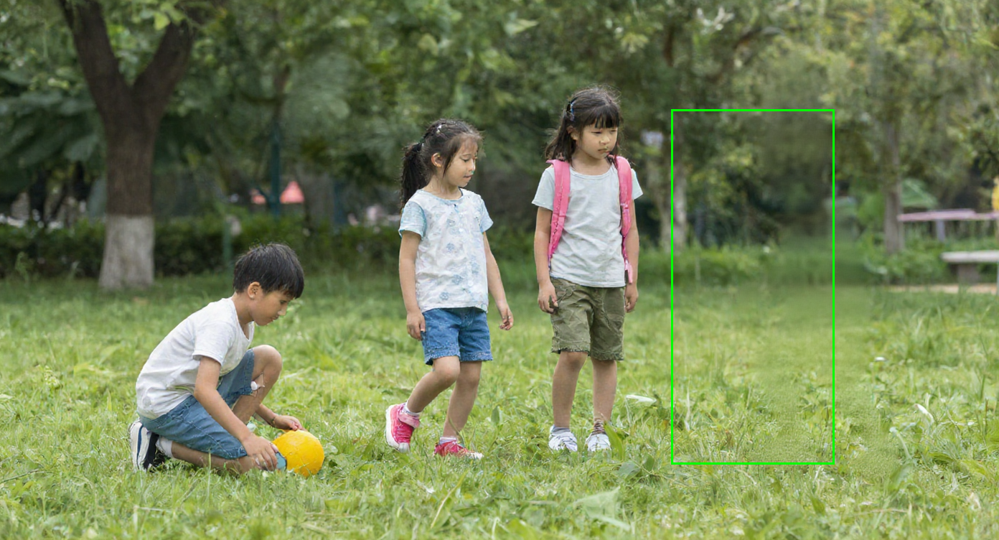

In [26]:
box = random.choice(xyxy)
inpainted_image = flux_kontext_inpaint(pipe, image, box, "Remove all people from the image")
ann3 = Annotator(inpainted_image.copy())
ann3.box_label(box, color=(0, 255, 0))
Image.fromarray(ann3.result())

In [42]:
x1, y1, x2, y2 = box
box2 = np.array([x1, y1 + 0.4 * abs(y2 - y1), x2, y2])
prompt = random.choice(prompts)
image2 = flux_kontext_inpaint(pipe, inpainted_image, box2, prompt)

  0%|          | 0/28 [00:00<?, ?it/s]

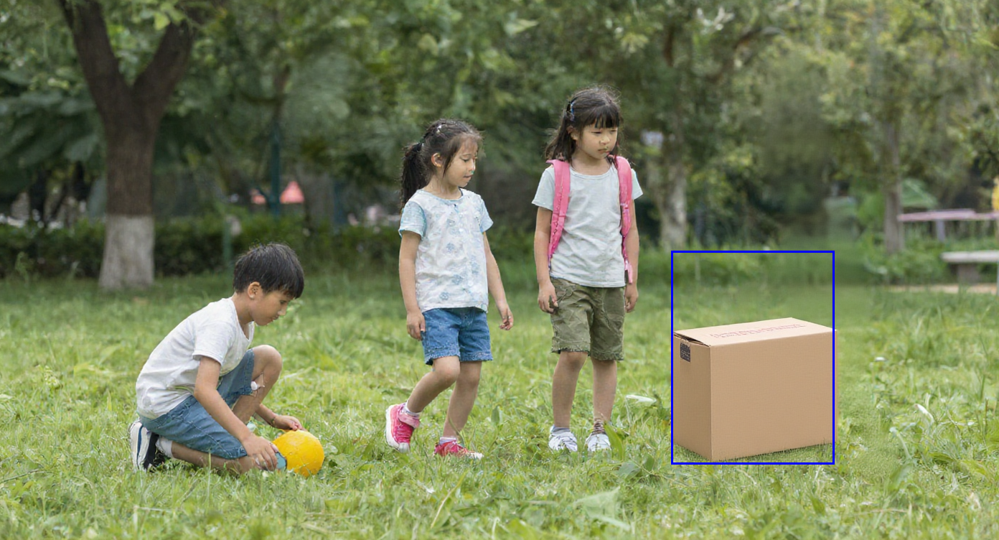

In [43]:
ann2 = Annotator(image2.copy())
ann2.box_label(box2, color=(0, 0, 255))
Image.fromarray(ann2.result())